In [1]:
import pandas as pd

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
import re
import os
import numpy as np
import torch.nn as nn
import torchvision.models as models
import keras
import keras_nlp
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim

from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, GlobalMaxPooling2D, Dropout, Dense, BatchNormalization, Activation, LeakyReLU, ReLU
from tensorflow.keras.models import Sequential
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam

from sklearn.model_selection import GroupShuffleSplit
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error

from matplotlib.image import imread

from transformers import BertTokenizer, BertModel
from tqdm import tqdm
from nltk.tokenize import word_tokenize 
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords 
from nltk.corpus import wordnet
from nltk import pos_tag
from torchvision import transforms
from PIL import Image

/opt/anaconda3/lib/python3.12/site-packages/transformers/utils/generic.py:441: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(
/opt/anaconda3/lib/python3.12/site-packages/transformers/utils/generic.py:309: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(


In [3]:
TRAIN_DIR = 'train_images/'
TEST_DIR = 'test_images/'
RANDOM_STATE = 42

# Прекод

# Сборный проект-5

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

## Описание данных

Данные доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


# Загрузка и изучение данных

In [6]:
def data_exploration(df, name):
    # Информация о датафрейме
    print(f'\033[1mИнформация о датафрейме {name}:\033[0m')
    df.info()
    print()
    # Первые пять строк датафрейма
    print(f'\033[1mПервые пять строк {name}:\033[0m')
    display(df.head())
    print()
    # Число дубликатов
    print(f'\033[1mЧисло дубликатов в {name}:\033[0m {df.duplicated().sum()}')
    print()
    # Пустые значения
    print(f'\033[1mПустые значения в {name}:\033[0m')
    print(df.isna().sum())
    print()

## Изучение табличных данных

In [8]:
pd.set_option('display.max_colwidth', None)

# Загрузка тренировочного датасета с описаниями
train_dataset = pd.read_csv('train_dataset.csv')
data_exploration(train_dataset, 'train_dataset')

# Загрузка аннотаций краудсорсинга
crowd_annotations = pd.read_csv(
    'CrowdAnnotations.tsv',
    sep='\t',
    header=None,
    names=['image',
    'query_id',
    'true_share',
    'true_count',
    'false_count'])

data_exploration(crowd_annotations, 'crowd_annotations')

# Загрузка аннотаций экспертов
expert_annotations = pd.read_csv('ExpertAnnotations.tsv',
    sep='\t',
    header=None,
    names=['image',
    'query_id',
    'expert1',
    'expert2',
    'expert3'])

data_exploration(expert_annotations, 'expert_annotations')

# Загрузка тестовых запросов
test_queries = pd.read_csv('test_queries.csv', sep='|', index_col = 0)
data_exploration(test_queries, 'test_queries')

Информация о датафрейме train_dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB

Первые пять строк train_dataset:


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .



Число дубликатов в train_dataset: 0

Пустые значения в train_dataset:
image         0
query_id      0
query_text    0
dtype: int64

Информация о датафрейме crowd_annotations:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        47830 non-null  object 
 1   query_id     47830 non-null  object 
 2   true_share   47830 non-null  float64
 3   true_count   47830 non-null  int64  
 4   false_count  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB

Первые пять строк crowd_annotations:


,image,query_id,true_share,true_count,false_count
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3



Число дубликатов в crowd_annotations: 0

Пустые значения в crowd_annotations:
image          0
query_id       0
true_share     0
true_count     0
false_count    0
dtype: int64

Информация о датафрейме expert_annotations:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   expert1   5822 non-null   int64 
 3   expert2   5822 non-null   int64 
 4   expert3   5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB

Первые пять строк expert_annotations:


,image,query_id,expert1,expert2,expert3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2



Число дубликатов в expert_annotations: 0

Пустые значения в expert_annotations:
image       0
query_id    0
expert1     0
expert2     0
expert3     0
dtype: int64

Информация о датафрейме test_queries:
<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB

Первые пять строк test_queries:


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at each other .,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each other .,1177994172_10d143cb8d.jpg



Число дубликатов в test_queries: 0

Пустые значения в test_queries:
query_id      0
query_text    0
image         0
dtype: int64



## Изучение изображений

Изучим тренировачные изображения

Found 1000 validated image filenames.


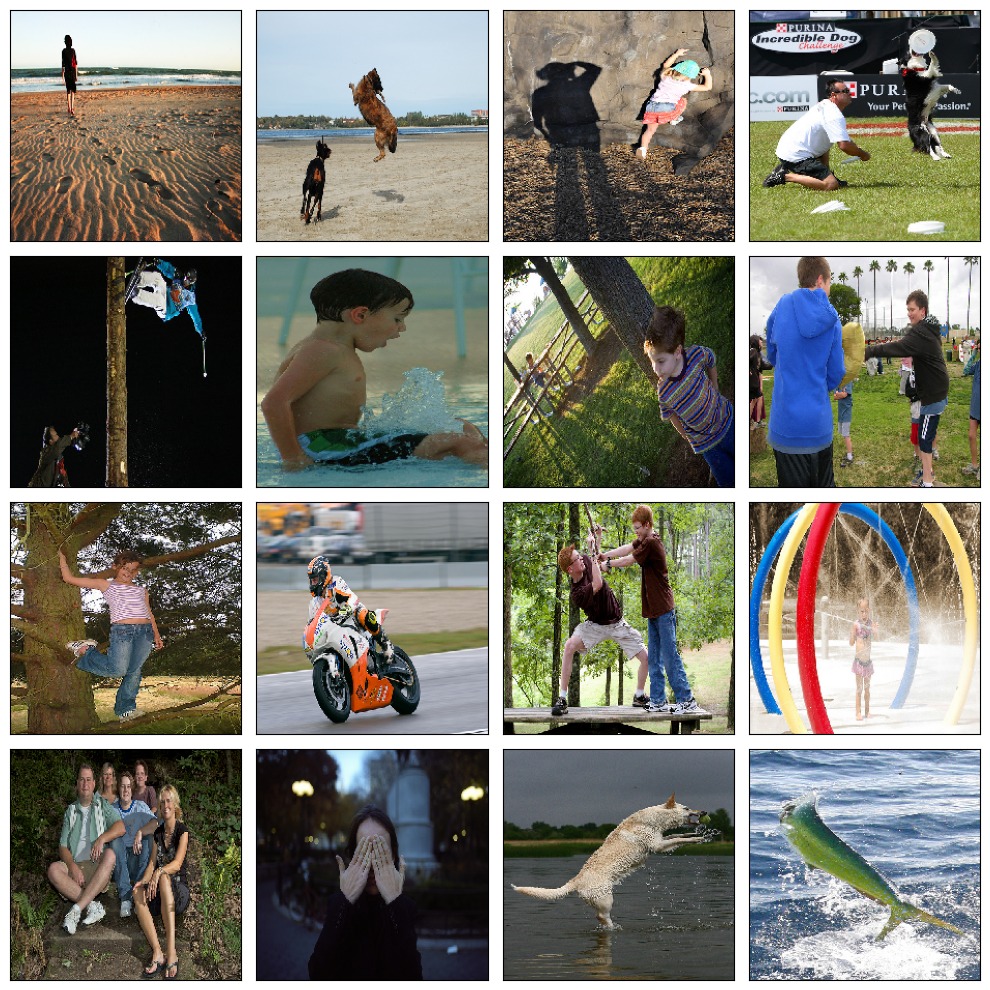

In [10]:
train_datagen = ImageDataGenerator(rescale=1./255)

train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=train_dataset.drop_duplicates(subset=['image']),
        directory=TRAIN_DIR,
        x_col='image',
        y_col='combined_score',
        target_size=(224, 224),
        batch_size=16,
        class_mode='input',
        seed=42)

image, target = next(train_gen_flow)

fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    plt.imshow(image[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

## Вывод:

- Открыты 4 таблицы
- train_dataset: 5822 строк, пропусков нет, дубликатов нет
- crowd_annotations: 47830 строк, пропусков нет, дубликатов нет
- expert_annotations: 5822 строк, пропусков нет, дубликатов нет
- test_queries: 500 строк, пропусков нет, дубликатов нет
- Получено 1000 изображений для обучения, изображения приведены в размер 224х224 для работы с RESNET50

# Исследовательский анализ данных

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. 

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов.

In [12]:
expert_annotations.describe()

,expert1,expert2,expert3
count,5822.000000,5822.000000,5822.000000
mean,1.436620,1.624356,1.881999
std,0.787084,0.856222,0.904087
min,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000
50%,1.000000,1.000000,2.000000
75%,2.000000,2.000000,2.000000
max,4.000000,4.000000,4.000000


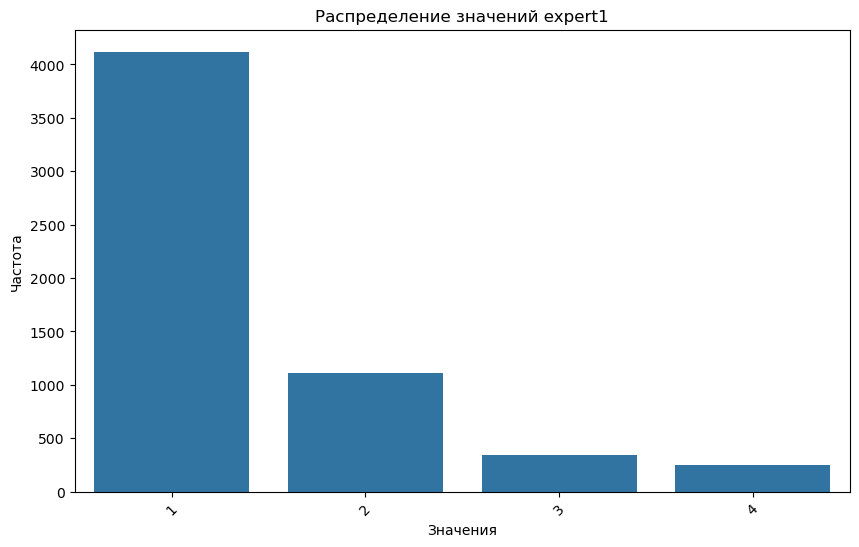

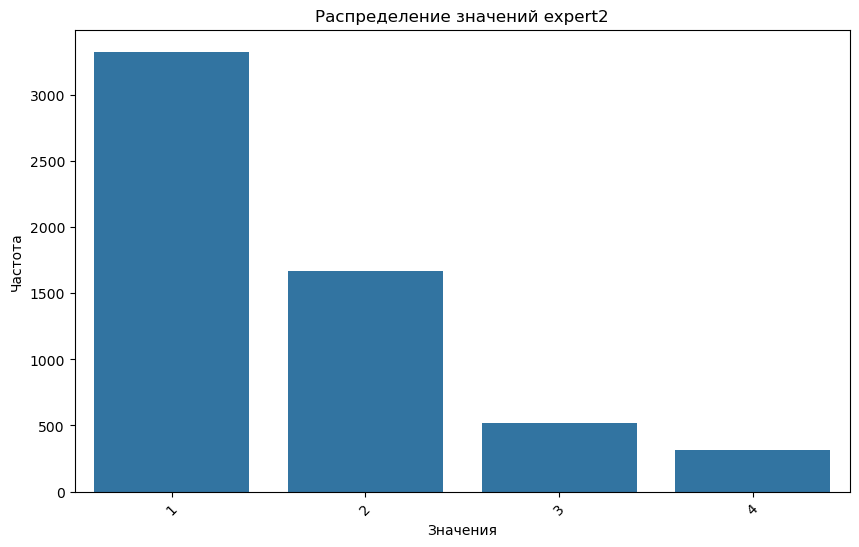

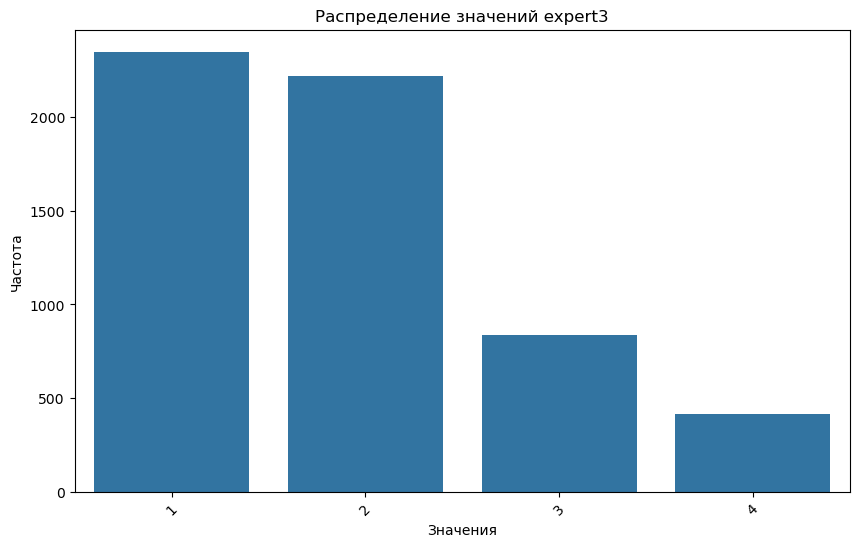

In [13]:
# Список столбцов, для которых необходимо построить графики
experts = ['expert1', 'expert2', 'expert3']

# Цикл для построения графиков для каждого столбца
for expert in experts:
    value_counts = expert_annotations[expert].value_counts()  # Подсчет значений
    plt.figure(figsize=(10, 6))
    sns.barplot(x=value_counts.index, y=value_counts.values)  # Построение графика
    
    # Настройка графика
    plt.title(f'Распределение значений {expert}')
    plt.xlabel('Значения')
    plt.ylabel('Частота')
    plt.xticks(rotation=45)
    plt.show()

__Вывод по оценкам экспертов:__ Эксперт №3 чаще указывал, что изображение соответствует запросу, а Эксперт №1 наоборот.

In [15]:
crowd_annotations.describe()

,true_share,true_count,false_count
count,47830.000000,47830.000000,47830.000000
mean,0.068786,0.208488,2.820155
std,0.207532,0.628898,0.656676
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,3.000000
50%,0.000000,0.000000,3.000000
75%,0.000000,0.000000,3.000000
max,1.000000,5.000000,6.000000


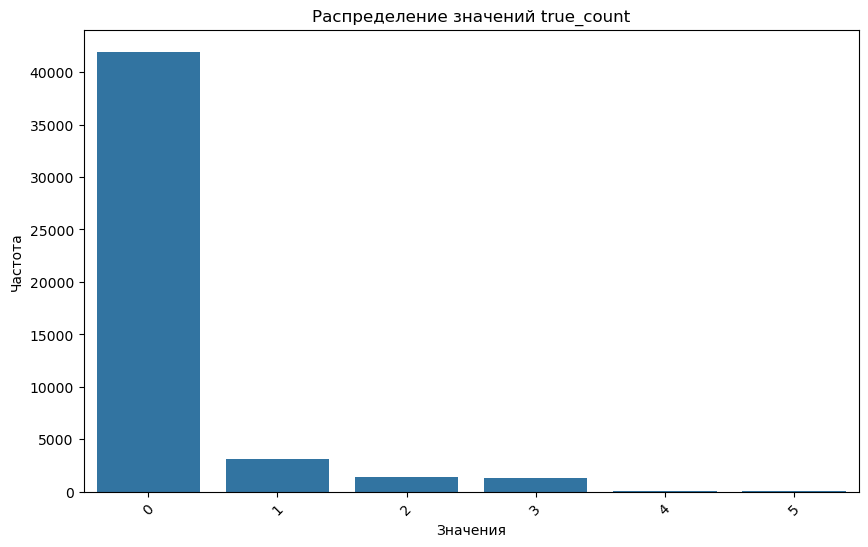

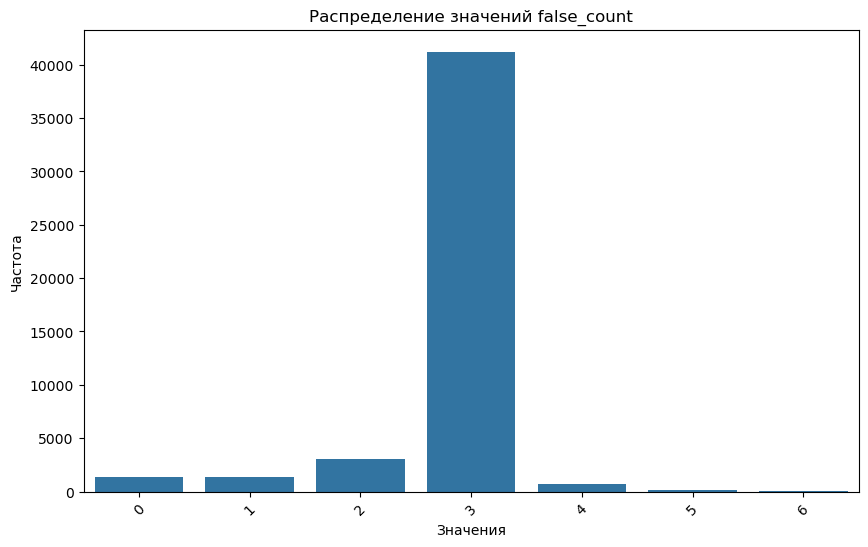

In [16]:
# Список столбцов, для которых необходимо построить графики
counts = ['true_count', 'false_count']

for count in counts:
    value_counts = crowd_annotations[count].value_counts()  # Подсчет значений
    plt.figure(figsize=(10, 6))
    sns.barplot(x=value_counts.index, y=value_counts.values)  # Построение графика
    
    # Настройка графика
    plt.title(f'Распределение значений {count}')
    plt.xlabel('Значения')
    plt.ylabel('Частота')
    plt.xticks(rotation=45)
    plt.show()

__Вывод по анализу аннотаций краудсорсинга:__

- В среднем доля истины по опросам около 7%
- Большинство опросников показало, что отсутвует совпадение картинки и описания

# Подготовка данных
## Определение агрегированной оценки экспертов 

Для определения оценки экспертов определим моду среди оценок. Если невозможно определить моду, отбросим данное наблюдение. 

In [19]:
def aggregate_expert_scores(row):
    scores = [row['expert1'], row['expert2'], row['expert3']]
    mode = pd.Series(scores).mode()
    if len(mode) == 1:
        return mode.iloc[0]
    else:
        return None  

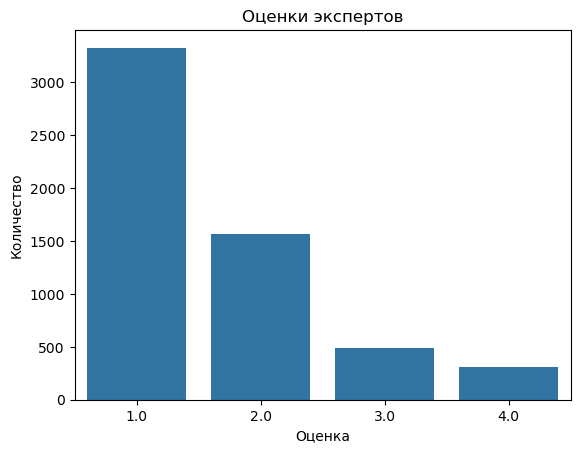

Количество оценок


aggregated_score
1.0    3327
2.0    1566
3.0     492
4.0     311
Name: count, dtype: int64

In [20]:
expert_annotations['aggregated_score'] = expert_annotations.apply(aggregate_expert_scores, axis=1)

# Исключение пар с несогласованными оценками
expert_annotations = expert_annotations.dropna(subset=['aggregated_score'])

expert_counts = expert_annotations['aggregated_score'].value_counts()

sns.barplot(x=expert_counts.index, y=expert_counts.values)
plt.xlabel('Оценка')
plt.ylabel('Количество')
plt.title('Оценки экспертов')
plt.show()

print('Количество оценок')
display(expert_counts)

__Итог:__

Из 5822 строк после выведения моды аггрегированной оценки осталось 5696 строк

Учитывая шкалу оценок экспертов, переведем ее в шкалу от 0 до 1, где: 

- 1 — изображение и запрос совершенно не соответствуют друг другу: уровень соответствия 0
- 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует: уровень соответствия 0.5
- 3 — запрос и текст соответствуют с точностью до некоторых деталей: уровень соответствия 0.75
- 4 — запрос и текст соответствуют полностью: уровень соответствия 1

In [22]:
# Создаём словарь соответствий
replacement_dict = {
    1: 0,
    2: 0.33,
    3: 0.66,
    4: 1
}

# Применяем замену
expert_annotations['aggregated_score'] = expert_annotations['aggregated_score'].replace(replacement_dict)

## Определение объединенной оценки

Объединим аннотации по наименованию файлов и описаниям.
В качестве оценки краудсорсинга, воспользуемся долей респондентов ответивших положительно касательно совпадения изображения и описания. 

Из-за того, что ответов краудсорсинга больше, для сохранения объема ответов для обучения будем объединять с сохранением несовпавших строк. Поэтому стратегия комбинации оценок будет следующей:

- При наличии совпадения по обеим таблицам: Для общей оценки (таргет) объединим оценки, где вес экспертной оценки 0.9, а вес краудсорсинговой оценки 0.1
- При отсутствия совпадения, будет использоваться единственная имеющаяся оценка

In [24]:
# Вычисление объединённой оценки с учетом весов
def calculate_combined_score(row):
    if pd.notna(row['aggregated_score']) and pd.notna(row['true_share']):
        return 0.9 * row['aggregated_score'] + 0.1 * row['true_share']
    elif pd.notna(row['aggregated_score']):
        return row['aggregated_score']
    elif pd.notna(row['true_share']):
        return row['true_share']
    else:
        return None

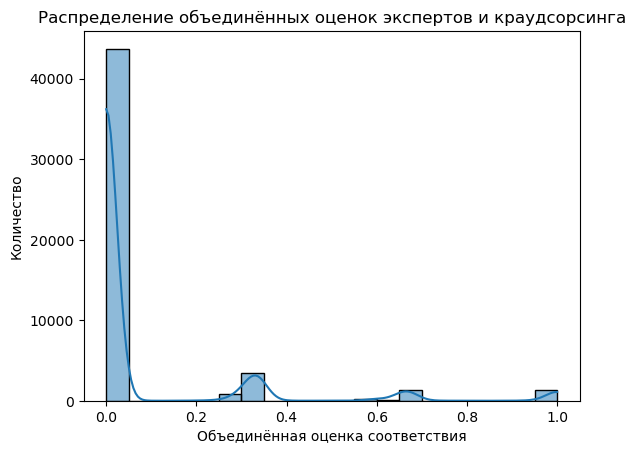

Информация о объединённом датафрейме:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51268 entries, 0 to 51267
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           51268 non-null  object 
 1   query_id        51268 non-null  object 
 2   combined_score  51268 non-null  float64
dtypes: float64(1), object(2)
memory usage: 1.2+ MB


None

Первые пять строк объединённого датафрейма:


,image,query_id,combined_score
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0


In [25]:
# Выбираем только необходимые столбцы для объединения
expert_subset = expert_annotations[['image', 'query_id', 'aggregated_score']]
crowd_subset = crowd_annotations[['image', 'query_id', 'true_share']]

#Выполняем объединение по 'file' и 'id_description'
train_df = pd.merge(
    expert_subset,
    crowd_subset,
    on=['image', 'query_id'],
    how='outer'  
)

#Вычисление объединённой оценки
train_df['combined_score'] = train_df.apply(calculate_combined_score, axis=1)

# Удаляем ненужные столбцы
train_df = train_df.drop(columns=['aggregated_score', 'true_share'])

#Визуализация распределения объединённых оценок
sns.histplot(train_df['combined_score'], bins=20, kde=True)
plt.xlabel('Объединённая оценка соответствия')
plt.ylabel('Количество')
plt.title('Распределение объединённых оценок экспертов и краудсорсинга')
plt.show()

#Выводим информацию о полученном датафрейме 
print('Информация о объединённом датафрейме:')
display(train_df.info())

print('Первые пять строк объединённого датафрейма:')
display(train_df.head())

## Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

In [27]:
nltk.download('stopwords') 
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package stopwords to /Users/denis/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/denis/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/denis/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /Users/denis/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [28]:
def get_wordnet_pos(word):
    tag = pos_tag([word])[0][1][0].upper()
    tag_dict = {
        'J': wordnet.ADJ,
        'N': wordnet.NOUN,
        'V': wordnet.VERB,
        'R': wordnet.ADV
    }
    return tag_dict.get(tag, wordnet.NOUN)

def prep(text):
    text = re.sub(r'[^a-zA-Z ]', ' ', text)
    text = text.lower()
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word not in stop_words]
    tokens = [lemmatizer.lemmatize(word, get_wordnet_pos(word)) for word in tokens]
    return ' '.join(tokens)

In [29]:
train_dataset['query_text_prep'] = train_dataset['query_text'].apply(prep)
train_dataset.head()

,image,query_id,query_text,query_text_prep
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,young child wear blue goggles sit float pool
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,young child wear blue goggles sit float pool
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,young child wear blue goggles sit float pool
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,young child wear blue goggles sit float pool
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,young child wear blue goggles sit float pool


In [30]:
BAN_DICT = ['young', 'infant', 'child', 'children', 'baby', 'babies', 'kid', 'kids', 'boy', 'boys', 'girl', 'girls', 'teen', 'youth', 'newborn', 'schoolgirl', 'schoolboy']
pattern = r'\b(' + '|'.join(BAN_DICT) + r')\b'

# Создание маски для строк, содержащих запрещённые слова
mask = train_dataset['query_text_prep'].str.contains(pattern, regex=True, na=False)

# Вывод количества строк, содержащих запрещённые слова
num_banned = mask.sum()
print(f"Количество строк, содержащих запрещённые слова: {num_banned}")

# Удаление строк с запрещёнными словами
train_dataset_filtered = train_dataset[~mask].copy()

# Вывод информации о фильтрации
print(f"Исходное количество строк: {len(train_dataset)}")
print(f"Количество строк после удаления: {len(train_dataset_filtered)}")

Количество строк, содержащих запрещённые слова: 1621
Исходное количество строк: 5822
Количество строк после удаления: 4201


/var/folders/pk/4b6mpfcx3p7bn9sg_s3hkv6r0000gn/T/ipykernel_51490/187135164.py:5: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  mask = train_dataset['query_text_prep'].str.contains(pattern, regex=True, na=False)


In [31]:
train_dataset_filtered.reset_index(drop=True, inplace = True)
train_dataset_filtered.head()

,image,query_id,query_text,query_text_prep
0,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,man sleep blanket city street
1,3187395715_f2940c2b72.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,man sleep blanket city street
2,463978865_c87c6ca84c.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,man sleep blanket city street
3,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,man sleep blanket city street
4,534875358_6ea30d3091.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,man sleep blanket city street


In [32]:
# Выполняем объединение по 'query_id' для добавления 'query_text_prep'
train_df_clean = pd.merge(
    train_df, 
    train_dataset_filtered[['query_id', 'query_text_prep']], 
    on='query_id', 
    how='right'
)

train_df_clean.drop_duplicates(inplace=True)
train_df_clean = train_df_clean.dropna()

# Проверим результат
print('Информация о объединённом датафрейме с добавленным столбцом query_text_prep:')
display(train_df_clean.info())

print('Первые пять строк объединённого датафрейма:')
display(train_df_clean.head())

Информация о объединённом датафрейме с добавленным столбцом query_text_prep:
<class 'pandas.core.frame.DataFrame'>
Index: 35450 entries, 0 to 234995
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            35450 non-null  object 
 1   query_id         35450 non-null  object 
 2   combined_score   35450 non-null  float64
 3   query_text_prep  35450 non-null  object 
dtypes: float64(1), object(3)
memory usage: 1.4+ MB


None

Первые пять строк объединённого датафрейма:


,image,query_id,combined_score,query_text_prep
0,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.0,man sleep blanket city street
1,1174629344_a2e1a2bdbf.jpg,3181701312_70a379ab6e.jpg#2,0.0,man sleep blanket city street
2,1262583859_653f1469a9.jpg,3181701312_70a379ab6e.jpg#2,0.0,man sleep blanket city street
3,132489044_3be606baf7.jpg,3181701312_70a379ab6e.jpg#2,0.0,man sleep blanket city street
4,1332722096_1e3de8ae70.jpg,3181701312_70a379ab6e.jpg#2,0.0,man sleep blanket city street


__Вывод:__ После фильтрации описаний на запрещенные данных, оставлено 35450 строк

# Векторизация изображений

Перейдём к векторизации изображений.

In [34]:
train_datagen = ImageDataGenerator(rescale=1./255)

train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=train_df_clean,
        directory=TRAIN_DIR,
        x_col='image',
        y_col='combined_score',
        target_size=(224, 224),
        batch_size=32,
        class_mode='input',
        seed=RANDOM_STATE)

image, target = next(train_gen_flow)

Found 35450 validated image filenames.


In [35]:
backbone = ResNet50(input_shape=(224, 224, 3),
                 include_top=False,
                 weights='imagenet')

backbone.trainable = False

model_image = Sequential([
        backbone,
        GlobalMaxPooling2D(),
        BatchNormalization(),
        Dense(units=512)
    ])

In [36]:
model_image.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling2d            │ (None, 2048)           │             0 │
│ (GlobalMaxPooling2D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     1,049,088 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,644,992 (94.01 MB)

 Trainable params: 1,053,184 (4.02 MB)

 Non-trainable params: 23,591,808 (90.00 MB)

In [37]:
image_embedings = model_image.predict(train_gen_flow)

/opt/anaconda3/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1108/1108 ━━━━━━━━━━━━━━━━━━━━ 1063s 959ms/step


In [38]:
image_embedings.shape

(35450, 512)

# Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


In [40]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(f'Используется устройство: {device}')

Используется устройство: cpu


In [41]:
# Загрузка предобученного токенизатора и модели BERT
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')
model.to(device)
model.eval()  # Перевод модели в режим оценки

# Функция для генерации эмбеддингов
def get_bert_embeddings(text_list, tokenizer, model, device, batch_size=32):
    embeddings = []
    with torch.no_grad():
        for i in tqdm(range(0, len(text_list), batch_size), desc="Генерация эмбеддингов"):
            batch_texts = text_list[i:i+batch_size]
            encoded_input = tokenizer(
                batch_texts,
                padding=True,
                truncation=True,
                max_length=512,
                return_tensors='pt'
            )
            encoded_input = {key: val.to(device) for key, val in encoded_input.items()}
            output = model(**encoded_input)
            cls_embeddings = output.last_hidden_state[:, 0, :].cpu().numpy()
            embeddings.append(cls_embeddings)
    return np.vstack(embeddings)

/opt/anaconda3/lib/python3.12/site-packages/huggingface_hub/file_download.py:1150: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [42]:
# Генерация эмбеддингов
query_texts = train_df_clean['query_text_prep'].tolist()
bert_embeddings = get_bert_embeddings(query_texts, tokenizer, model, device, batch_size=32)

Генерация эмбеддингов: 100%|██████████| 1108/1108 [01:57<00:00,  9.45it/s]


In [43]:
bert_embeddings.shape

(35450, 768)

# Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [45]:
#Создание DataFrame с эмбеддингами изображений
image_emb_df = pd.DataFrame(
    image_embedings,
    columns=[f'image_emb_{i}' for i in range(image_embedings.shape[1])]
)

#Создание DataFrame с эмбеддингами текстов
bert_emb_df = pd.DataFrame(
    bert_embeddings,
    columns=[f'text_emb_{i}' for i in range(bert_embeddings.shape[1])]
)

#Объединение эмбеддингов с таблицей содержащей данные для тренировки модели
combined_df = pd.concat([train_df_clean.reset_index(drop=True), image_emb_df, bert_emb_df], axis=1)

# Удаляем ненужные столбцы
combined_df = combined_df.drop(columns=['query_id', 'query_text_prep'])

In [46]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35450 entries, 0 to 35449
Columns: 1282 entries, image to text_emb_767
dtypes: float32(1280), float64(1), object(1)
memory usage: 173.6+ MB


# Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

In [48]:
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=RANDOM_STATE)
train_indices, test_indices = next(gss.split(X=combined_df.drop(columns=['combined_score']), y=combined_df['combined_score'], groups=combined_df['image']))
train_df_model, test_df_model = combined_df.loc[train_indices], combined_df.loc[test_indices]

In [49]:
X_train = train_df_model.drop(columns=['image', 'combined_score'])
y_train = train_df_model['combined_score']
X_test = test_df_model.drop(columns=['image', 'combined_score'])
y_test = test_df_model['combined_score']

In [50]:
X_test.shape[1]

1280

## Линейная регрессия и дерево решений

In [52]:
pipe_final = Pipeline([
        ('Scaler', StandardScaler()),
        ('models', LinearRegression())  
        ])

# Словарь гиперпараметров моделей
param_dist = [
    # Словарь для модели DecisionTreeRegressor
    {
        'models': [DecisionTreeRegressor(random_state=RANDOM_STATE)],
        'models__max_depth': range(1, 12)
    },
    # Словарь для модели LinearRegression
    {
        'models': [LinearRegression()]}
]

In [53]:
random_search = RandomizedSearchCV(
    pipe_final, 
    param_distributions=param_dist, 
    cv=5,           
    scoring='neg_mean_absolute_error',    
    n_jobs=-1,       
    random_state=RANDOM_STATE
)

In [54]:
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('Scaler', StandardScaler()),
                                             ('models', LinearRegression())]),
                   n_jobs=-1,
                   param_distributions=[{'models': [DecisionTreeRegressor(random_state=42)],
                                         'models__max_depth': range(1, 12)},
                                        {'models': [LinearRegression()]}],
                   random_state=42, scoring='neg_mean_absolute_error')

In [55]:
print('Лучшая модель и её параметры:\n\n', random_search.best_estimator_)
print ('Метрика лучшей модели на кросс-валидации:', random_search.best_score_)

Лучшая модель и её параметры:

 Pipeline(steps=[('Scaler', StandardScaler()),
                ('models',
                 DecisionTreeRegressor(max_depth=2, random_state=42))])
Метрика лучшей модели на кросс-валидации: -0.14522119012748136


In [56]:
result = pd.DataFrame(random_search.cv_results_)
display(result[
    ['rank_test_score', 'param_models', 'mean_test_score','params']
].sort_values('rank_test_score').head()) 

,rank_test_score,param_models,mean_test_score,params
6,1,DecisionTreeRegressor(random_state=42),-0.145221,"{'models__max_depth': 2, 'models': DecisionTreeRegressor(random_state=42)}"
5,2,DecisionTreeRegressor(random_state=42),-0.145551,"{'models__max_depth': 3, 'models': DecisionTreeRegressor(random_state=42)}"
8,3,DecisionTreeRegressor(random_state=42),-0.146327,"{'models__max_depth': 5, 'models': DecisionTreeRegressor(random_state=42)}"
4,4,DecisionTreeRegressor(random_state=42),-0.146363,"{'models__max_depth': 6, 'models': DecisionTreeRegressor(random_state=42)}"
2,5,DecisionTreeRegressor(random_state=42),-0.146598,"{'models__max_depth': 1, 'models': DecisionTreeRegressor(random_state=42)}"


In [57]:
#Подготовим предсказания
y_pred = random_search.predict(X_test)
print("MAE:", mean_absolute_error(y_test, y_pred))

MAE: 0.14117178680926765


## Нейросеть

In [59]:
numerical_columns = combined_df.select_dtypes(include=['number'], exclude=['object']).columns.tolist()

#Исключим целевой признак из анализа
numerical_columns.remove('combined_score')

In [60]:
# Создание трансформеров для числовых и категориальных данных
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

# Подготовка препроцессора
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numerical_columns)
    ])

In [61]:
# Применение предобработки к данным
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

In [62]:
# Преобразование данных в тензоры
X_train_tensor = torch.FloatTensor(X_train_preprocessed)
X_test_tensor = torch.FloatTensor(X_test_preprocessed)
y_train_tensor = torch.FloatTensor(y_train.values)
y_test_tensor = torch.FloatTensor(y_test.values)

In [160]:
model_nn = Sequential([
    Dense(640, input_shape=(X_test.shape[1],), activation='relu'),
    BatchNormalization(),
    Dense(320, activation='relu', kernel_regularizer=l2(0.00001)),
    BatchNormalization(),
    Dense(160, activation='relu', kernel_regularizer=l2(0.00001)),
    Dropout(0.3),
    Dense(1, activation='sigmoid')
])

model_nn.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=0.0001),
    metrics=['mean_absolute_error']
)

/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [162]:
model_nn.fit(X_train_tensor, y_train_tensor,
             epochs=50,
             batch_size=64,
             validation_data=(X_test_tensor, y_test_tensor),
             verbose=1)

Epoch 1/50
386/386 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.1367 - mean_absolute_error: 0.2582 - val_loss: 0.0560 - val_mean_absolute_error: 0.1109
Epoch 2/50
386/386 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.0595 - mean_absolute_error: 0.1216 - val_loss: 0.0556 - val_mean_absolute_error: 0.1089
Epoch 3/50
386/386 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.0553 - mean_absolute_error: 0.1179 - val_loss: 0.0556 - val_mean_absolute_error: 0.1095
Epoch 4/50
386/386 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.0541 - mean_absolute_error: 0.1175 - val_loss: 0.0550 - val_mean_absolute_error: 0.1114
Epoch 5/50
386/386 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.0506 - mean_absolute_error: 0.1142 - val_loss: 0.0555 - val_mean_absolute_error: 0.1140
Epoch 6/50
386/386 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.0493 - mean_absolute_error: 0.1133 - val_loss: 0.0558 - val_mean_absolute_error: 0.1142
Epoch 7/50
386/386 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.0469 - mean_absolute_error: 0.1097 - v

In [164]:
nn_preds = model_nn.predict(X_test)
print("MAE:", mean_absolute_error(y_test, nn_preds))

338/338 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step
MAE: 0.0850343088036125


## Вывод по модели
- Классический ML демонистрирует уровень MAE: 0.14
- Нейросеть демонстрирует уровень MAE: 0.08
- Таким образом тестирование будет проходить на нейросети

# Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

## Подготовка тестовых данных
### Подготовка изображений 

In [68]:
test_datagen = ImageDataGenerator(rescale=1./255)

test_gen_flow = test_datagen.flow_from_dataframe(
        dataframe=test_queries,
        directory=TEST_DIR,
        x_col='image',
        y_col=None,
        target_size=(224, 224),
        batch_size=32,
        class_mode='input',
        seed=RANDOM_STATE)

image, target = next(test_gen_flow)

Found 500 validated image filenames.


In [69]:
test_image_embedings = model_image.predict(test_gen_flow)

/opt/anaconda3/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


16/16 ━━━━━━━━━━━━━━━━━━━━ 16s 973ms/step


In [70]:
test_image_embedings.shape

(500, 512)

In [71]:
test_image_emb_df = pd.DataFrame(
    test_image_embedings,
    columns=[f'image_emb_{i}' for i in range(test_image_embedings.shape[1])]
)

test_image_emb_df.head()

,image_emb_0,image_emb_1,image_emb_2,image_emb_3,image_emb_4,image_emb_5,image_emb_6,image_emb_7,image_emb_8,image_emb_9,...,image_emb_502,image_emb_503,image_emb_504,image_emb_505,image_emb_506,image_emb_507,image_emb_508,image_emb_509,image_emb_510,image_emb_511
0,2.886733,-3.154829,2.903120,2.729730,-2.785875,-0.424255,3.553249,-1.517022,2.368253,-1.300629,...,-3.173092,0.831004,-1.970546,-0.542073,1.092936,1.281589,0.828266,3.981073,2.069473,1.059821
1,3.289728,-3.638062,3.225832,1.434094,-2.473597,0.455877,1.940902,-1.486568,2.048664,-1.614091,...,-2.078481,-0.559570,-2.004501,-0.804163,0.983302,1.005844,0.968147,3.449067,2.676973,-0.335201
2,3.123737,-2.559929,2.646043,1.653667,-2.667709,0.957842,1.626898,-1.749940,2.188553,-1.638680,...,-2.440047,-0.992488,-2.387697,-0.632836,1.072901,0.350330,0.605778,3.250564,2.489679,-0.190612
3,3.071082,-3.526099,3.380728,1.944836,-2.050570,0.669539,1.961416,-1.647097,2.035067,-1.364273,...,-2.191224,-0.123220,-1.882911,-0.848341,0.811817,0.828346,0.608228,3.462724,2.664297,0.479435
4,3.372947,-3.119063,2.847455,1.611625,-2.372639,0.944594,1.435487,-1.962245,1.941535,-1.343623,...,-2.011480,-0.976870,-2.292917,-0.541289,0.538360,0.019820,0.253583,3.729491,2.681728,-0.156338


### Подготовка функций для тестирования

In [166]:
#Функция создания эмбеддинга для входящего описания
def process_and_embed(input_string):
    preprocessed_text = prep(input_string)
    embedding = get_bert_embeddings([preprocessed_text], tokenizer, model, device)
    df = pd.DataFrame(embedding, columns=[f'text_emb_{i}' for i in range(embedding.shape[1])])
    return df

#Функция для объединения эмбеддингов изображений с эмбеддингом входящего описания
def text_image_df(input_string):
    df_text = process_and_embed(input_string)
    test_image_emb_df_copy = test_image_emb_df.copy()
    repeated_text_df = pd.concat([df_text]*len(test_image_emb_df_copy), ignore_index=True)
    text_image_df_res = pd.concat([test_image_emb_df_copy, repeated_text_df], axis=1)
    return text_image_df_res

#Функция для прогнозирования на основе входящего описания и объеденение с датафреймов тестовых запросов
def prediction_query(input_string):
    predict_df = text_image_df(input_string)
    prep_predict_df = preprocessor.transform(predict_df)
    prep_predict_tensor = torch.FloatTensor(prep_predict_df)
    predictions = model_nn.predict(prep_predict_tensor)
    predictions_df = pd.DataFrame(predictions, columns=['predictions'])
    test_queries_copy = test_queries.copy()
    df_pred = pd.concat([test_queries_copy, predictions_df], axis=1)
    return df_pred  

#Функция для определения фактической картинки.
def test_inference(input_string):
    print(input_string)
    if any(bad_word.lower() in input_string.lower() for bad_word in BAN_DICT):
        print()
        print('This image is unavailable in your country in compliance with local laws')
        print()
    else:
        df_pred = prediction_query(input_string)
        top5 = df_pred.sort_values(by='predictions', ascending=False).drop_duplicates(subset='image').head(5)

        # Отобразим топ-5 изображений по предсказаниям
        fig, axes = plt.subplots(1, 5, figsize=(20, 4))
        plt.tight_layout()

        for ax, (_, row) in zip(axes, top5.iterrows()):
            image_path = f"{TEST_DIR}/{row['image']}"
            image = Image.open(image_path)
            ax.imshow(image)
            ax.set_title(f"{row['predictions']:.5f}")
            ax.axis('off')

        # Отразим настоящее изображение
        if input_string in df_pred['query_text'].values:
            matching_query = df_pred[df_pred['query_text'] == input_string].iloc[0]
            query_image_path = f"{TEST_DIR}/{matching_query['image']}"
            query_image = Image.open(query_image_path)
            fig, ax = plt.subplots(figsize=(4, 4))
            ax.imshow(query_image)
            ax.set_title("Query Image")
            ax.axis('off')
            plt.show()

        plt.show()
    
    print('-' * 100)
    return None

### Тестирование

Two dogs are chewing at a red object whilst running in the snow .


Генерация эмбеддингов: 100%|██████████| 1/1 [00:00<00:00,  7.60it/s]

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


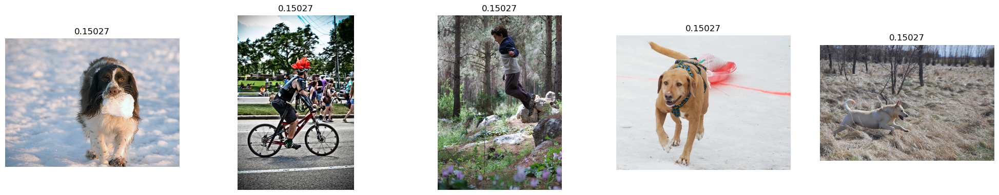

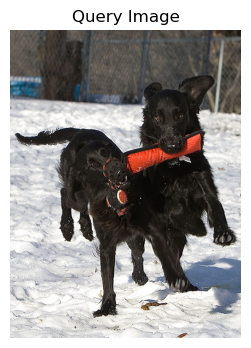

----------------------------------------------------------------------------------------------------
Two men standing at the feet of a large sculpture .


Генерация эмбеддингов: 100%|██████████| 1/1 [00:00<00:00,  6.87it/s]

 1/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


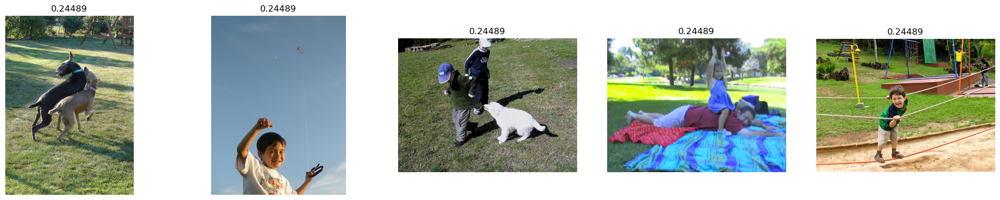

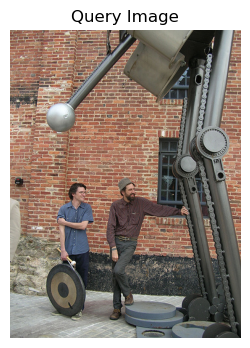

----------------------------------------------------------------------------------------------------
A brown dog and a black dog run into each other in the grass .


Генерация эмбеддингов: 100%|██████████| 1/1 [00:00<00:00, 18.45it/s]

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


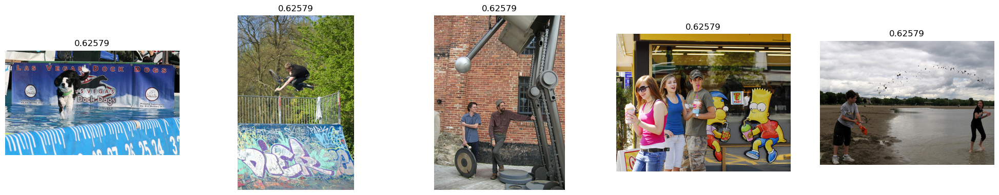

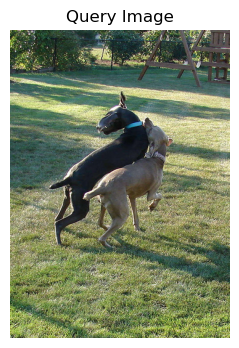

----------------------------------------------------------------------------------------------------
One person snowboarding while others look on .


Генерация эмбеддингов: 100%|██████████| 1/1 [00:00<00:00, 15.77it/s]

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


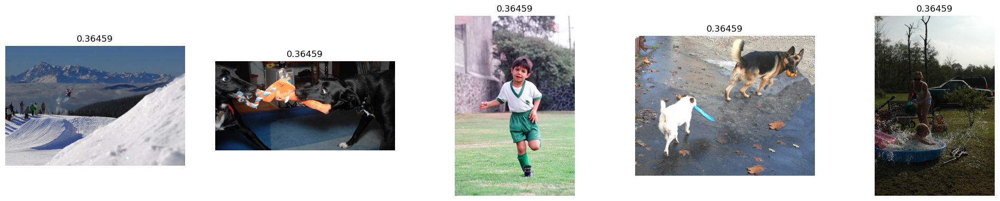

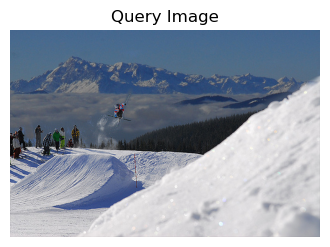

----------------------------------------------------------------------------------------------------
A snowboarder takes a ramp made of snow while others watch .


Генерация эмбеддингов: 100%|██████████| 1/1 [00:00<00:00, 20.09it/s]

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


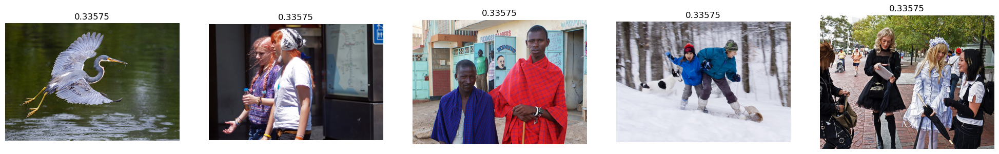

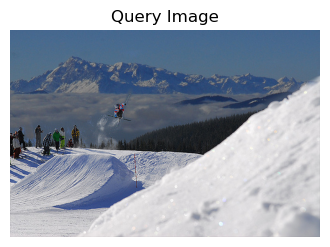

----------------------------------------------------------------------------------------------------
A man with glasses wearing all black sits on grass surrounded by other people .


Генерация эмбеддингов: 100%|██████████| 1/1 [00:00<00:00, 13.74it/s]

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


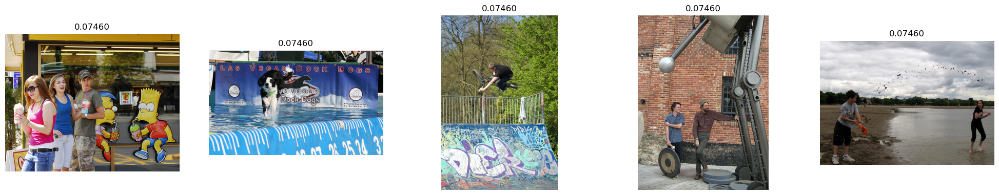

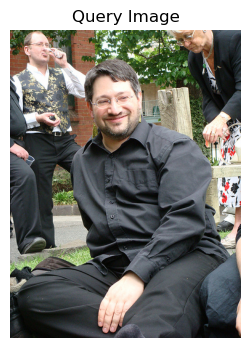

----------------------------------------------------------------------------------------------------
A group of people gather on the grass field and throw a pink hoop .


Генерация эмбеддингов: 100%|██████████| 1/1 [00:00<00:00, 21.49it/s]

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


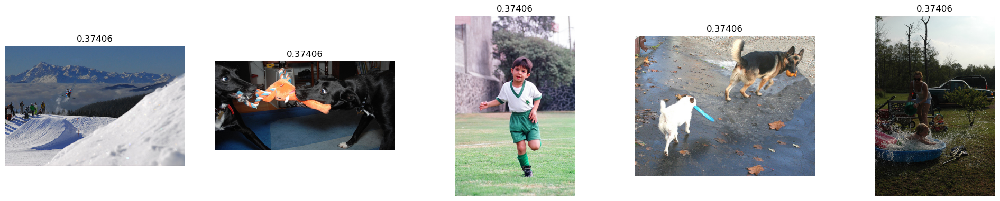

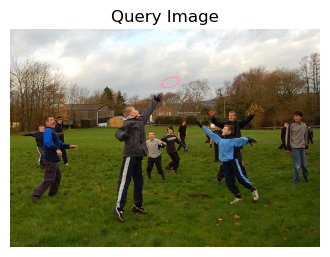

----------------------------------------------------------------------------------------------------
There is a little blond hair girl with a green sweatshirt and a red shirt playing on a playground .

This image is unavailable in your country in compliance with local laws

----------------------------------------------------------------------------------------------------
A dog jumps to catch a red ball outside .


Генерация эмбеддингов: 100%|██████████| 1/1 [00:00<00:00, 22.06it/s]

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


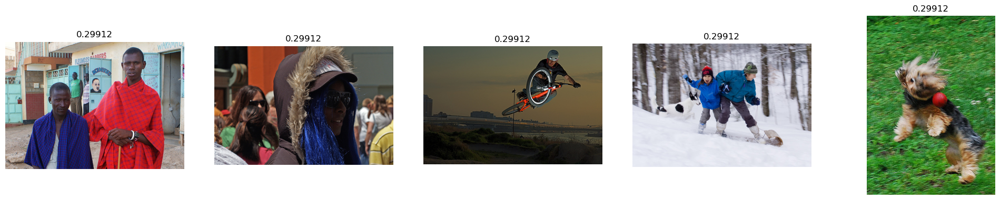

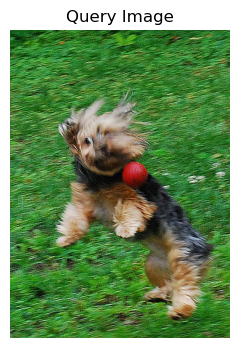

----------------------------------------------------------------------------------------------------
Two women reviewing pictures they took .


Генерация эмбеддингов: 100%|██████████| 1/1 [00:00<00:00, 21.42it/s]

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


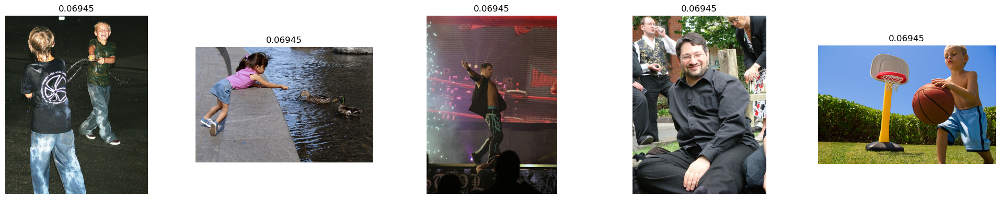

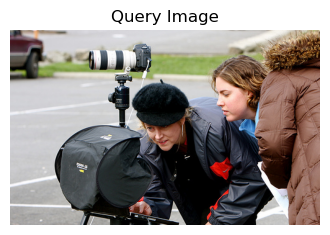

----------------------------------------------------------------------------------------------------


In [169]:
test_phrases = list(test_queries['query_text'].sample(10))
for phrase in test_phrases:
    test_inference(phrase)

# Вывод

- Открыты 4 таблицы
- train_dataset: 5822 строк, пропусков нет, дубликатов нет
- crowd_annotations: 47830 строк, пропусков нет, дубликатов нет
- expert_annotations: 5822 строк, пропусков нет, дубликатов нет
- test_queries: 500 строк, пропусков нет, дубликатов нет
- Получено 1000 изображений для обучения, изображения приведены в размер 224х224 для работы с RESNET50
- Объеденены оценки краудсорсинга и экспертов. Взят вес 90% оценка эксперта и 10% оценка краудсорсинга при наличии оценок для одних и тех же описаний. В случае отсутствия оценки краудсорсинга/эксперта взята имеющая оценка. 
- Ответов краудсорсинга больше, для сохранения объема оценок под обучение данные объединены с сохранением несовпавших строк, итого 51268
- После фильтрации описаний, было оставлено 35450 строк
- Выполнена векторизация описаний и изображений. Векторы объединены.
- Обучена классические ML модели и нейросеть. Нейросеть показала при тестировании уровень MAE: 0.08, что лучше показателя для классических ML моделей.
- На тесте, модель показать 2 корректных изображения. 